## В этом ноутбуке будут разобраны библиотека python для работы с цветами картинок

#### Мы будем использовать Pillow. Её команды для установки могут отличаться в зависимости от ОС.

In [3]:
import statistics as stat

In [4]:
import numpy as np

In [16]:
pip install Pillow

Note: you may need to restart the kernel to use updated packages.


In [5]:
from PIL import Image

In [6]:
profile_pic = Image.open("/Users/levtsipes/Desktop/Work/DeMAS/IMG_1287.png") #загружает картинку

In [7]:
profile_pic.show() #выводит картинку в отдельном окне

In [8]:
print(profile_pic.format) #выводит формат картинки

PNG


In [9]:
image_rgb = profile_pic.convert("RGB") #форматирует картинку в РГБ формате

In [10]:
print(image_rgb.size) #выводит размер картинки

(3024, 4032)


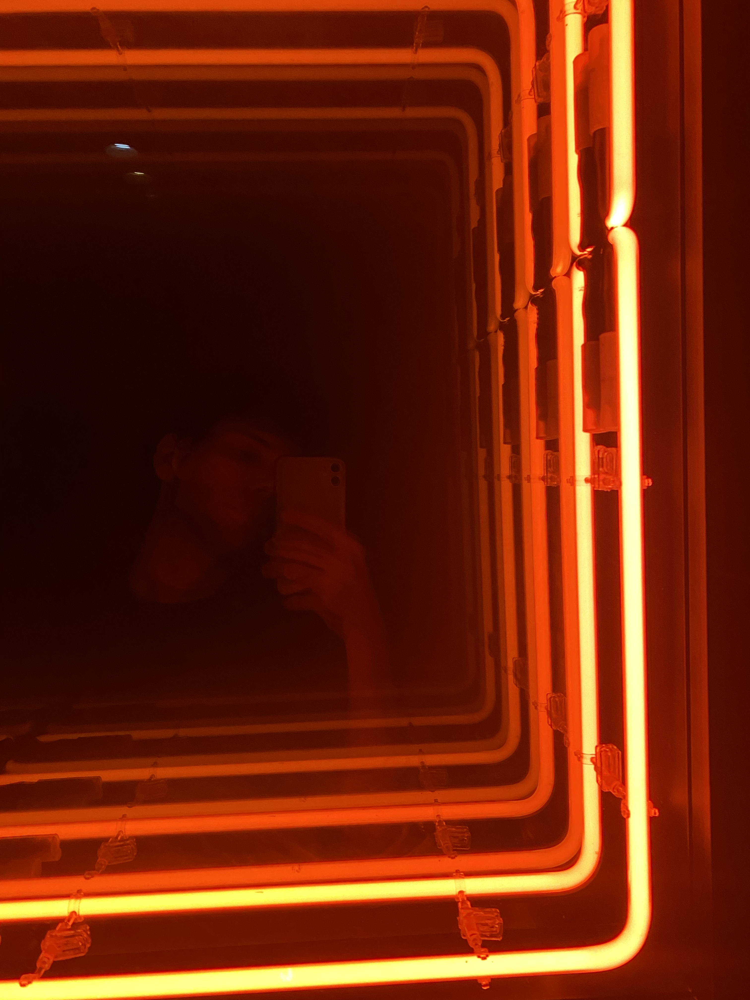

In [11]:
image_rgb #открывает картинку в ноубуке

In [12]:
rgb_pixel_value = image_rgb.getpixel((10,15)) #выводит РГБ код пиксель с заданными координатами

In [13]:
print(rgb_pixel_value) #от 0 до 255

(213, 71, 8)


In [14]:
#ниже представлен алгоритм, чтобы посчитать среднее значине RGB value картинки
average_RGBs=[]
for i in range(image_rgb.size[0]):
    for j in range(image_rgb.size[1]):
        average_RGBs.append(stat.mean(image_rgb.getpixel((i,j))))
print('Mean RGB value: ',stat.mean(average_RGBs))

#можно анализировать не все пиксели (например, в рассматриваемой мной картинке их больше 12 млн),
#а звять какое-то рандомное значение

Mean RGB value:  52.24001312362651


In [15]:
#ниже коды для отдельно красных, зелёных и голубых

#--------------------------------------------------------------------------------------------------------------

Rs=[]
for i in range(image_rgb.size[0]):
    for j in range(image_rgb.size[1]):
        Rs.append(image_rgb.getpixel((i,j))[0])
print('Mean R value: ',stat.mean(Rs))

#--------------------------------------------------------------------------------------------------------------

Gs=[]
for i in range(image_rgb.size[0]):
    for j in range(image_rgb.size[1]):
        Gs.append(image_rgb.getpixel((i,j))[1])
print('Mean G value: ',stat.mean(Gs))

#--------------------------------------------------------------------------------------------------------------

Bs=[]
for i in range(image_rgb.size[0]):
    for j in range(image_rgb.size[1]):
        Bs.append(image_rgb.getpixel((i,j))[2])
print('Mean B value: ',stat.mean(Bs))

Mean R value:  109.57858191019463
Mean G value:  36.452672600676074
Mean B value:  10.688784860008818


In [ ]:
#Объединённый более быстрый код 

Rs=[]
Gs=[]
Bs=[]

for i in range(image_rgb.size[0]):
    for j in range(image_rgb.size[1]):
        Rs.append(image_rgb.getpixel((i,j))[0])
        Gs.append(image_rgb.getpixel((i,j))[1])
        Bs.append(image_rgb.getpixel((i,j))[2])
print('Mean B value: ',stat.mean(Bs))

In [16]:
grey_pic = profile_pic.convert('L') #конвертируем фотографию в Ч/Б

In [17]:
# the sharpness can be estimated by the average gradient magnitude.
# больше о градиентах в картинках тут: https://en.wikipedia.org/wiki/Image_gradient

array = np.asarray(grey_pic, dtype=np.int32)
gy, gx = np.gradient(array)
gnorm = np.sqrt(gx**2 + gy**2)
sharpness = np.average(gnorm)
print('sharpness: ',sharpness)

sharpness:  1.9317549073929707


In [31]:
#другие комманды библиотеки представлены тут: https://pythonru.com/biblioteki/osnovnye-vozmozhnosti-biblioteki-python-imaging-library-pillow-pil

In [32]:
#больше библиотек по работе с картинками на питоне здесь: https://analyticsindiamag.com/top-8-image-processing-libraries-in-python/

In [ ]:
#теперь нам наужны показатели HSV (тон, насыщенность, значение)
#Тут объяснено, что такое HSV https://miro.medium.com/max/1400/1*U_V7U0s6sTiMqAyIu8HuJg.png

#HSV - это другая система определения цвета, как и RGB. Имея значени RGB (получили раньше), мы можем перевести их 
#в значения HSV

#для этого понадоится библиотека colorsys

In [2]:
import colorsys

In [20]:
#https://www.docs4dev.com/docs/en/python/3.7.2rc1/all/library-colorsys.html
#https://www.programcreek.com/python/example/8844/colorsys.rgb_to_hsv

h, s, v = colorsys.rgb_to_hsv(stat.mean(Rs)/255.0, stat.mean(Gs)/255.0, stat.mean(Bs)/255.0)

h = h*360
s = s*100
v = v*100

print(h,s,v)

15.6318782174822 90.24555285012829 42.97199290595868
